In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML

E:\Anaconda\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Activation, Flatten, BatchNormalization, Conv2D, MaxPool2D,Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications import imagenet_utils
from sklearn.metrics import confusion_matrix
from tensorflow.keras.optimizers import Adam
import itertools
import os
import shutil
import random
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras.models import Sequential

import cv2

E:\Anaconda\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


ModuleNotFoundError: No module named 'cv2'

In [4]:
!pip install split-folders

Defaulting to user installation because normal site-packages is not writeable


In [7]:
import splitfolders

In [12]:
import splitfolders


input_folder = r"C:\Users\User\Desktop\mobileNet_Try\copy" 
output_folder = r"C:\Users\User\Desktop\mobileNet_Try\dataset"


splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.8, 0.1, 0.1))


Copying files: 1235 files [00:14, 85.59 files/s] 


In [3]:
train_ds = 'dataset/train'
valid_ds = 'dataset/val'
test_ds = 'dataset/test'

# data preprocces

In [4]:
train_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input).flow_from_directory(
    directory=train_ds, target_size=(224,224), batch_size=10)
valid_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input).flow_from_directory(
    directory=valid_ds, target_size=(224,224), batch_size=10)
test_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input).flow_from_directory(
    directory=test_ds, target_size=(224,224), batch_size=10, shuffle=False)

Found 986 images belonging to 6 classes.
Found 120 images belonging to 6 classes.
Found 129 images belonging to 6 classes.


In [9]:
import tensorflow as tf


mobile_net_v2 = tf.keras.applications.MobileNetV2()


In [10]:
mobile_net_v2.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[

 block_3_expand_relu (ReLU)  (None, 56, 56, 144)          0         ['block_3_expand_BN[0][0]']   
                                                                                                  
 block_3_pad (ZeroPadding2D  (None, 57, 57, 144)          0         ['block_3_expand_relu[0][0]'] 
 )                                                                                                
                                                                                                  
 block_3_depthwise (Depthwi  (None, 28, 28, 144)          1296      ['block_3_pad[0][0]']         
 seConv2D)                                                                                        
                                                                                                  
 block_3_depthwise_BN (Batc  (None, 28, 28, 144)          576       ['block_3_depthwise[0][0]']   
 hNormalization)                                                                                  
          

 block_6_depthwise_BN (Batc  (None, 14, 14, 192)          768       ['block_6_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_6_depthwise_relu (Re  (None, 14, 14, 192)          0         ['block_6_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_6_project (Conv2D)    (None, 14, 14, 64)           12288     ['block_6_depthwise_relu[0][0]
                                                                    ']                            
                                                                                                  
 block_6_project_BN (BatchN  (None, 14, 14, 64)           256       ['block_6_project[0][0]']     
 ormalizat

                                                                                                  
 block_9_add (Add)           (None, 14, 14, 64)           0         ['block_8_add[0][0]',         
                                                                     'block_9_project_BN[0][0]']  
                                                                                                  
 block_10_expand (Conv2D)    (None, 14, 14, 384)          24576     ['block_9_add[0][0]']         
                                                                                                  
 block_10_expand_BN (BatchN  (None, 14, 14, 384)          1536      ['block_10_expand[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_10_expand_relu (ReLU  (None, 14, 14, 384)          0         ['block_10_expand_BN[0][0]']  
 )        

                                                                                                  
 block_13_expand_relu (ReLU  (None, 14, 14, 576)          0         ['block_13_expand_BN[0][0]']  
 )                                                                                                
                                                                                                  
 block_13_pad (ZeroPadding2  (None, 15, 15, 576)          0         ['block_13_expand_relu[0][0]']
 D)                                                                                               
                                                                                                  
 block_13_depthwise (Depthw  (None, 7, 7, 576)            5184      ['block_13_pad[0][0]']        
 iseConv2D)                                                                                       
                                                                                                  
 block_13_

 iseConv2D)                                                                                       
                                                                                                  
 block_16_depthwise_BN (Bat  (None, 7, 7, 960)            3840      ['block_16_depthwise[0][0]']  
 chNormalization)                                                                                 
                                                                                                  
 block_16_depthwise_relu (R  (None, 7, 7, 960)            0         ['block_16_depthwise_BN[0][0]'
 eLU)                                                               ]                             
                                                                                                  
 block_16_project (Conv2D)   (None, 7, 7, 320)            307200    ['block_16_depthwise_relu[0][0
                                                                    ]']                           
          

# Remove last 2 layesr in the mobile_net_v2

In [12]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
mobile_net_v2 = MobileNetV2(weights='imagenet', include_top=True)


new_model = tf.keras.Model(inputs=mobile_net_v2.input, outputs=mobile_net_v2.layers[-2].output)


new_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_3[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

 block_3_expand_relu (ReLU)  (None, 56, 56, 144)          0         ['block_3_expand_BN[0][0]']   
                                                                                                  
 block_3_pad (ZeroPadding2D  (None, 57, 57, 144)          0         ['block_3_expand_relu[0][0]'] 
 )                                                                                                
                                                                                                  
 block_3_depthwise (Depthwi  (None, 28, 28, 144)          1296      ['block_3_pad[0][0]']         
 seConv2D)                                                                                        
                                                                                                  
 block_3_depthwise_BN (Batc  (None, 28, 28, 144)          576       ['block_3_depthwise[0][0]']   
 hNormalization)                                                                                  
          

 block_6_depthwise_BN (Batc  (None, 14, 14, 192)          768       ['block_6_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_6_depthwise_relu (Re  (None, 14, 14, 192)          0         ['block_6_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_6_project (Conv2D)    (None, 14, 14, 64)           12288     ['block_6_depthwise_relu[0][0]
                                                                    ']                            
                                                                                                  
 block_6_project_BN (BatchN  (None, 14, 14, 64)           256       ['block_6_project[0][0]']     
 ormalizat

                                                                                                  
 block_9_add (Add)           (None, 14, 14, 64)           0         ['block_8_add[0][0]',         
                                                                     'block_9_project_BN[0][0]']  
                                                                                                  
 block_10_expand (Conv2D)    (None, 14, 14, 384)          24576     ['block_9_add[0][0]']         
                                                                                                  
 block_10_expand_BN (BatchN  (None, 14, 14, 384)          1536      ['block_10_expand[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_10_expand_relu (ReLU  (None, 14, 14, 384)          0         ['block_10_expand_BN[0][0]']  
 )        

                                                                                                  
 block_13_expand_relu (ReLU  (None, 14, 14, 576)          0         ['block_13_expand_BN[0][0]']  
 )                                                                                                
                                                                                                  
 block_13_pad (ZeroPadding2  (None, 15, 15, 576)          0         ['block_13_expand_relu[0][0]']
 D)                                                                                               
                                                                                                  
 block_13_depthwise (Depthw  (None, 7, 7, 576)            5184      ['block_13_pad[0][0]']        
 iseConv2D)                                                                                       
                                                                                                  
 block_13_

 iseConv2D)                                                                                       
                                                                                                  
 block_16_depthwise_BN (Bat  (None, 7, 7, 960)            3840      ['block_16_depthwise[0][0]']  
 chNormalization)                                                                                 
                                                                                                  
 block_16_depthwise_relu (R  (None, 7, 7, 960)            0         ['block_16_depthwise_BN[0][0]'
 eLU)                                                               ]                             
                                                                                                  
 block_16_project (Conv2D)   (None, 7, 7, 320)            307200    ['block_16_depthwise_relu[0][0
                                                                    ]']                           
          

# Add my customized last layer

In [13]:
num_classes = 6
new_last_layer = tf.keras.layers.Dense(num_classes, activation='softmax')(new_model.output)

# Create the final model with the new last layer
final_model = tf.keras.Model(inputs=new_model.input, outputs=new_last_layer)

# Print the summary of the final model
final_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_3[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']      

 block_3_expand_relu (ReLU)  (None, 56, 56, 144)          0         ['block_3_expand_BN[0][0]']   
                                                                                                  
 block_3_pad (ZeroPadding2D  (None, 57, 57, 144)          0         ['block_3_expand_relu[0][0]'] 
 )                                                                                                
                                                                                                  
 block_3_depthwise (Depthwi  (None, 28, 28, 144)          1296      ['block_3_pad[0][0]']         
 seConv2D)                                                                                        
                                                                                                  
 block_3_depthwise_BN (Batc  (None, 28, 28, 144)          576       ['block_3_depthwise[0][0]']   
 hNormalization)                                                                                  
          

 block_6_depthwise_BN (Batc  (None, 14, 14, 192)          768       ['block_6_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_6_depthwise_relu (Re  (None, 14, 14, 192)          0         ['block_6_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_6_project (Conv2D)    (None, 14, 14, 64)           12288     ['block_6_depthwise_relu[0][0]
                                                                    ']                            
                                                                                                  
 block_6_project_BN (BatchN  (None, 14, 14, 64)           256       ['block_6_project[0][0]']     
 ormalizat

                                                                                                  
 block_9_add (Add)           (None, 14, 14, 64)           0         ['block_8_add[0][0]',         
                                                                     'block_9_project_BN[0][0]']  
                                                                                                  
 block_10_expand (Conv2D)    (None, 14, 14, 384)          24576     ['block_9_add[0][0]']         
                                                                                                  
 block_10_expand_BN (BatchN  (None, 14, 14, 384)          1536      ['block_10_expand[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_10_expand_relu (ReLU  (None, 14, 14, 384)          0         ['block_10_expand_BN[0][0]']  
 )        

                                                                                                  
 block_13_expand_relu (ReLU  (None, 14, 14, 576)          0         ['block_13_expand_BN[0][0]']  
 )                                                                                                
                                                                                                  
 block_13_pad (ZeroPadding2  (None, 15, 15, 576)          0         ['block_13_expand_relu[0][0]']
 D)                                                                                               
                                                                                                  
 block_13_depthwise (Depthw  (None, 7, 7, 576)            5184      ['block_13_pad[0][0]']        
 iseConv2D)                                                                                       
                                                                                                  
 block_13_

 iseConv2D)                                                                                       
                                                                                                  
 block_16_depthwise_BN (Bat  (None, 7, 7, 960)            3840      ['block_16_depthwise[0][0]']  
 chNormalization)                                                                                 
                                                                                                  
 block_16_depthwise_relu (R  (None, 7, 7, 960)            0         ['block_16_depthwise_BN[0][0]'
 eLU)                                                               ]                             
                                                                                                  
 block_16_project (Conv2D)   (None, 7, 7, 320)            307200    ['block_16_depthwise_relu[0][0
                                                                    ]']                           
          

In [14]:
final_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [15]:
history=final_model.fit(x=train_batches,
            steps_per_epoch=len(train_batches),
            validation_data=valid_batches,
            validation_steps=len(valid_batches),
            epochs=10,
            verbose=2
)

Epoch 1/10
99/99 - 117s - loss: 0.3882 - accuracy: 0.8793 - val_loss: 0.8109 - val_accuracy: 0.6750 - 117s/epoch - 1s/step
Epoch 2/10
99/99 - 122s - loss: 0.0721 - accuracy: 0.9848 - val_loss: 0.8489 - val_accuracy: 0.6250 - 122s/epoch - 1s/step
Epoch 3/10
99/99 - 128s - loss: 0.0472 - accuracy: 0.9868 - val_loss: 0.6523 - val_accuracy: 0.7583 - 128s/epoch - 1s/step
Epoch 4/10
99/99 - 124s - loss: 0.0381 - accuracy: 0.9888 - val_loss: 0.9091 - val_accuracy: 0.7250 - 124s/epoch - 1s/step
Epoch 5/10
99/99 - 140s - loss: 0.0195 - accuracy: 0.9970 - val_loss: 0.5575 - val_accuracy: 0.8250 - 140s/epoch - 1s/step
Epoch 6/10
99/99 - 126s - loss: 0.0404 - accuracy: 0.9888 - val_loss: 0.3517 - val_accuracy: 0.8667 - 126s/epoch - 1s/step
Epoch 7/10
99/99 - 126s - loss: 0.0202 - accuracy: 0.9939 - val_loss: 0.1540 - val_accuracy: 0.9417 - 126s/epoch - 1s/step
Epoch 8/10
99/99 - 124s - loss: 0.0182 - accuracy: 0.9959 - val_loss: 0.1077 - val_accuracy: 0.9750 - 124s/epoch - 1s/step
Epoch 9/10
99/99

In [17]:
import os.path
final_model.save('V1.0.h5')

C:\Users\User\AppData\Roaming\Python\Python39\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [20]:
converter = tf.lite.TFLiteConverter.from_keras_model(final_model)
tflite_model = converter.convert()

# Define the complete path and filename for saving the model
tflite_model_path = "C:/Users/User/Desktop/mobileNet_Try/TenserflowLite/final_model.tflite"

# Save the TensorFlow Lite model to the specified location
with open(tflite_model_path, 'wb') as f:
    f.write(tflite_model)

print(f"TensorFlow Lite model saved at: {tflite_model_path}")


INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmp3bhf_fgi\assets


INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmp3bhf_fgi\assets


TensorFlow Lite model saved at: C:/Users/User/Desktop/mobileNet_Try/TenserflowLite/final_model.tflite


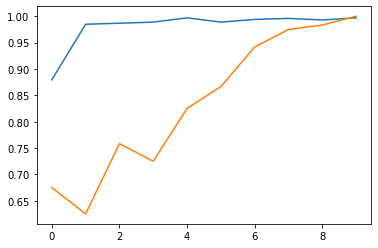

In [21]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

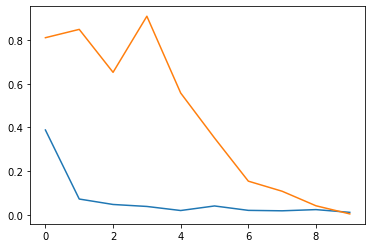

In [22]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

In [23]:
test_batches.class_indices

{'Corynespora': 0,
 'Healthy': 1,
 'Pesta': 2,
 'Powdery mildew': 3,
 'birda eyes': 4,
 'colletorichum leaf disease': 5}

In [24]:
test_labels = test_batches.classes

In [25]:
predictions = final_model.predict(x=test_batches, steps=len(test_batches), verbose=0)

In [26]:
predictions

array([[9.99998569e-01, 4.68545203e-08, 1.03901402e-06, 1.12864218e-09,
        2.52485091e-08, 3.57393475e-07],
       [9.99997854e-01, 8.67425420e-09, 3.55566243e-07, 5.39465450e-09,
        1.68543977e-06, 9.04721560e-08],
       [9.99363482e-01, 9.34489435e-06, 6.13655837e-04, 9.16448251e-09,
        7.68347320e-07, 1.26868936e-05],
       [9.99778330e-01, 4.92829713e-07, 1.45916769e-04, 1.74545003e-05,
        5.31524383e-05, 4.62600156e-06],
       [9.99943137e-01, 4.04564986e-08, 5.14294261e-05, 1.11073882e-06,
        4.28924437e-07, 3.87352657e-06],
       [9.99948621e-01, 1.06175748e-05, 3.85713065e-05, 4.76398547e-08,
        1.27169142e-06, 8.22981576e-07],
       [9.81921554e-01, 1.77751717e-05, 1.74039379e-02, 1.92016250e-05,
        1.93236498e-04, 4.44250501e-04],
       [9.99814808e-01, 7.62697746e-05, 4.93774023e-05, 1.15144658e-05,
        3.70909293e-05, 1.08892809e-05],
       [9.99623656e-01, 1.39140539e-07, 3.45897948e-04, 1.43468719e-06,
        2.18989797e-07, 

In [30]:
import cv2

# Load an image from file
image_path = "C:/Users/User/Desktop/test01BE.jpeg"  # Replace with the actual image path
image = cv2.imread(image_path)

my_image = img_to_array(image)
my_image = my_image.reshape((1, my_image.shape[0], my_image.shape[1], my_image.shape[2]))

my_image = tf.keras.applications.mobilenet.preprocess_input(my_image)
prediction = new_model.predict(my_image)
predict_val=np.round(prediction)
predict_val

ModuleNotFoundError: No module named 'cv2'

In [31]:
pip install opencv-python


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [32]:
import cv2

# Load an image from file
image_path = "C:/Users/User/Desktop/test01BE.jpeg"  # Replace with the actual image path
image = cv2.imread(image_path)

my_image = img_to_array(image)
my_image = my_image.reshape((1, my_image.shape[0], my_image.shape[1], my_image.shape[2]))

my_image = tf.keras.applications.mobilenet.preprocess_input(my_image)
prediction = new_model.predict(my_image)
predict_val=np.round(prediction)
predict_val

NameError: name 'img_to_array' is not defined

In [33]:
# Assuming you have preprocessed your test data into 'test_batches' (similar to how you preprocessed your train and validation data)
# 'test_batches' should be an instance of ImageDataGenerator.flow_from_directory()

# Get predictions from the model
predictions = final_model.predict(test_batches)

# Convert predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)

# Get actual labels from the 'test_batches' object
actual_labels = test_batches.classes

# Get class names from the 'test_batches' object
class_names = list(test_batches.class_indices.keys())

# Iterate through the test batch and print image filename, predicted class name, and actual class name
for i in range(len(test_batches.filenames)):
    image_filename = test_batches.filenames[i]
    predicted_class_name = class_names[predicted_labels[i]]
    actual_class_name = class_names[actual_labels[i]]
    
    
    print(f"Image: {image_filename} | Predicted: {predicted_class_name} | Actual: {actual_class_name}" )


13/13 [==============================] - 7s 566ms/step
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.29 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.40 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.00 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.01 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.14 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.24 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora
Image: Corynespora\WhatsApp Image 2023-04-12 at 1

13/13 [==============================] - 7s 553ms/step


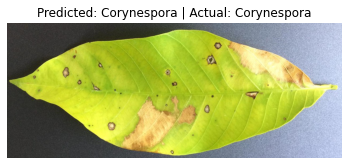

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.29 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


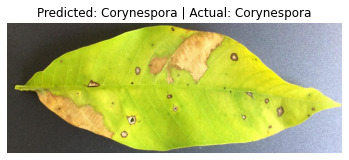

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


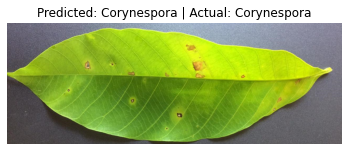

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.40 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


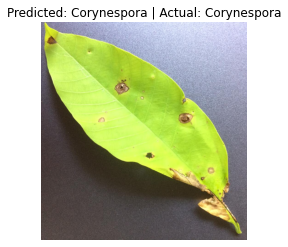

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.00 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


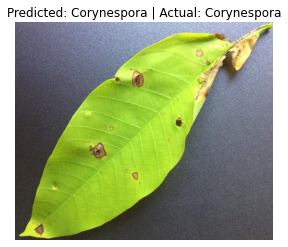

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.01 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


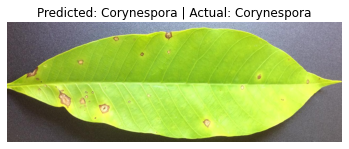

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.14 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


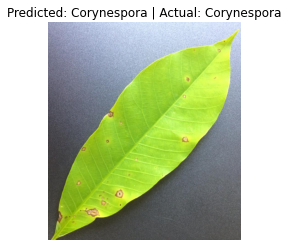

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.24 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


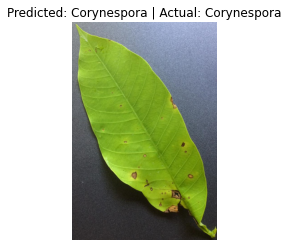

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


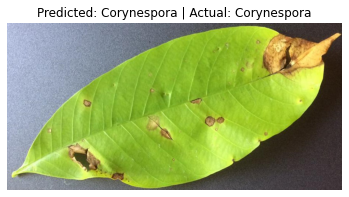

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.37.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


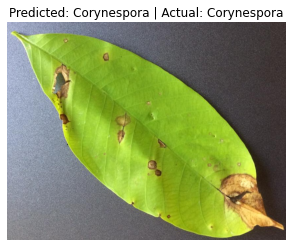

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.37.35 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


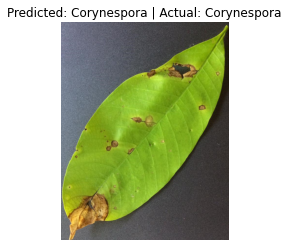

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.37.50 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


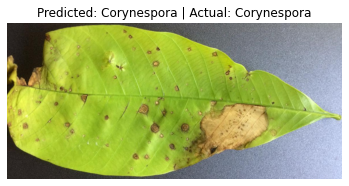

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.38.13 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


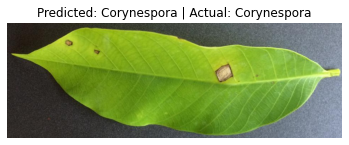

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.38.22 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


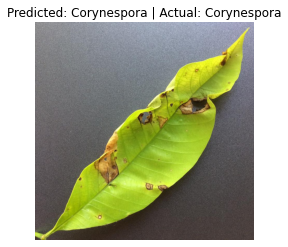

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.40.30 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


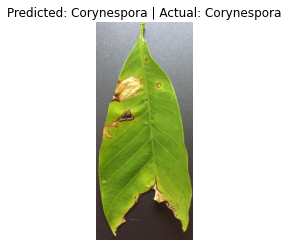

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.10.10 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


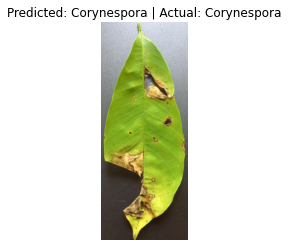

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.10.59 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


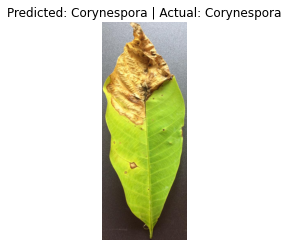

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.12.17 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


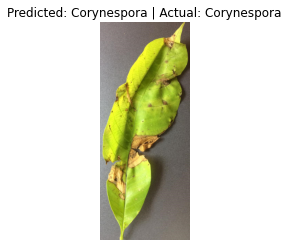

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.13.06 AM.jpeg | Predicted: Corynespora | Actual: Corynespora


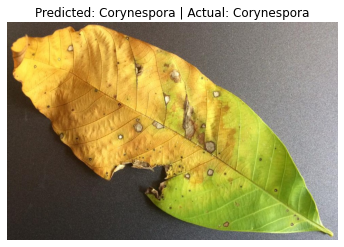

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.13.26 AM (1).jpeg | Predicted: Corynespora | Actual: Corynespora


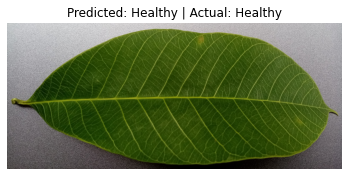

Image: Healthy\IMG_20230323_113856.jpg | Predicted: Healthy | Actual: Healthy


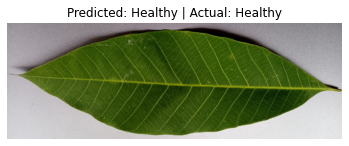

Image: Healthy\IMG_20230323_114110.jpg | Predicted: Healthy | Actual: Healthy


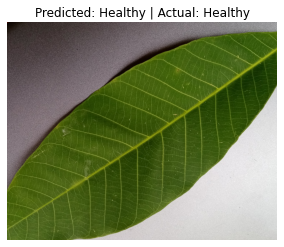

Image: Healthy\IMG_20230323_114116.jpg | Predicted: Healthy | Actual: Healthy


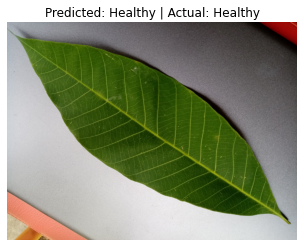

Image: Healthy\IMG_20230323_114125.jpg | Predicted: Healthy | Actual: Healthy


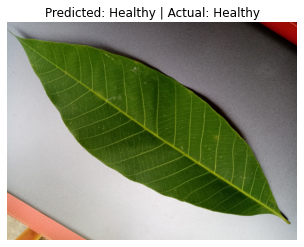

Image: Healthy\IMG_20230323_114126.jpg | Predicted: Healthy | Actual: Healthy


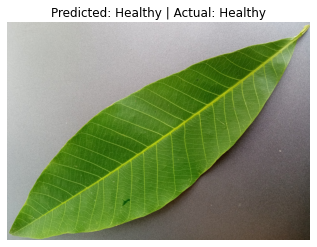

Image: Healthy\IMG_20230323_115040.jpg | Predicted: Healthy | Actual: Healthy


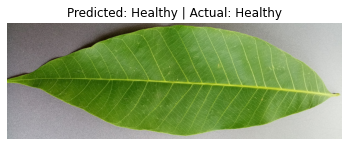

Image: Healthy\IMG_20230323_115233.jpg | Predicted: Healthy | Actual: Healthy


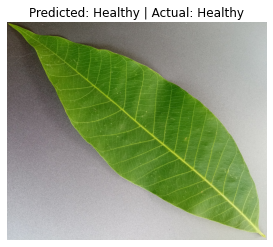

Image: Healthy\IMG_20230323_115253.jpg | Predicted: Healthy | Actual: Healthy


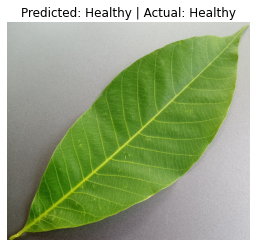

Image: Healthy\IMG_20230323_115417.jpg | Predicted: Healthy | Actual: Healthy


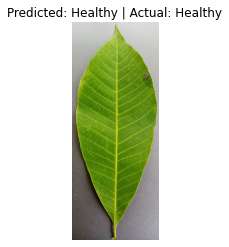

Image: Healthy\IMG_20230323_115640.jpg | Predicted: Healthy | Actual: Healthy


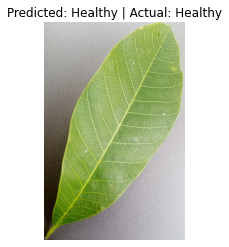

Image: Healthy\IMG_20230323_115747.jpg | Predicted: Healthy | Actual: Healthy


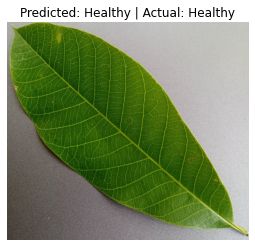

Image: Healthy\IMG_20230323_115754.jpg | Predicted: Healthy | Actual: Healthy


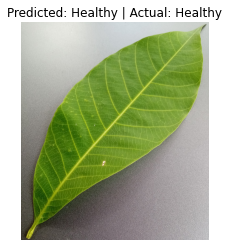

Image: Healthy\IMG_20230323_120037.jpg | Predicted: Healthy | Actual: Healthy


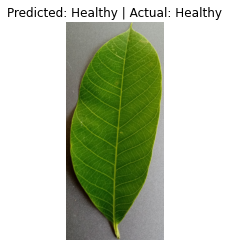

Image: Healthy\IMG_20230323_122429.jpg | Predicted: Healthy | Actual: Healthy


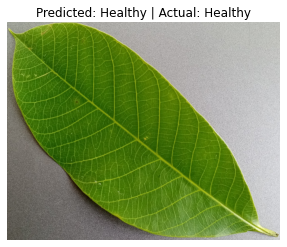

Image: Healthy\IMG_20230323_122434.jpg | Predicted: Healthy | Actual: Healthy


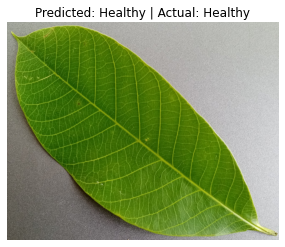

Image: Healthy\IMG_20230323_122436.jpg | Predicted: Healthy | Actual: Healthy


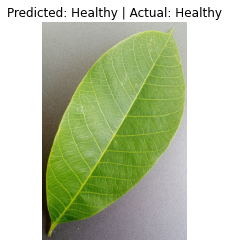

Image: Healthy\IMG_20230323_122447.jpg | Predicted: Healthy | Actual: Healthy


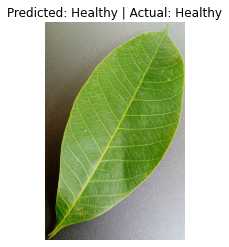

Image: Healthy\IMG_20230323_122602.jpg | Predicted: Healthy | Actual: Healthy


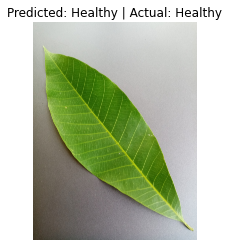

Image: Healthy\IMG_20230323_122639.jpg | Predicted: Healthy | Actual: Healthy


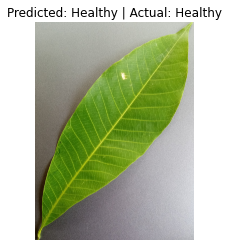

Image: Healthy\IMG_20230323_122902.jpg | Predicted: Healthy | Actual: Healthy


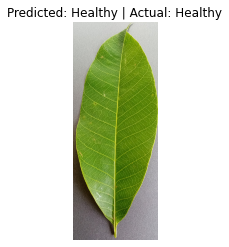

Image: Healthy\IMG_20230323_122946.jpg | Predicted: Healthy | Actual: Healthy


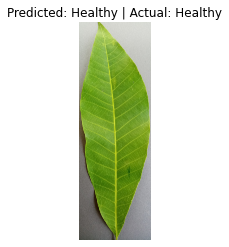

Image: Healthy\IMG_20230323_123422.jpg | Predicted: Healthy | Actual: Healthy


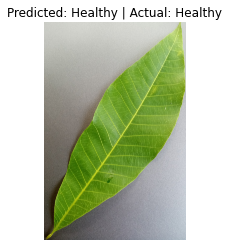

Image: Healthy\IMG_20230323_123429.jpg | Predicted: Healthy | Actual: Healthy


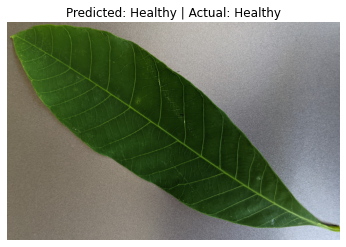

Image: Healthy\PXL_20230729_064146192.jpg | Predicted: Healthy | Actual: Healthy


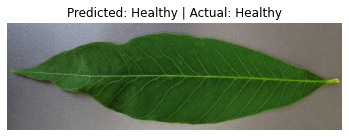

Image: Healthy\PXL_20230729_064206759.jpg | Predicted: Healthy | Actual: Healthy


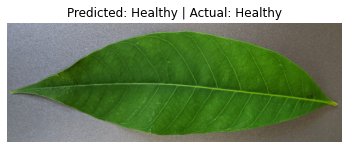

Image: Healthy\PXL_20230729_064339864.jpg | Predicted: Healthy | Actual: Healthy


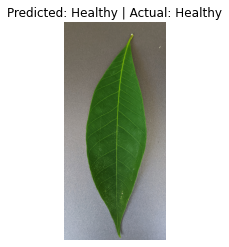

Image: Healthy\PXL_20230729_064632350.jpg | Predicted: Healthy | Actual: Healthy


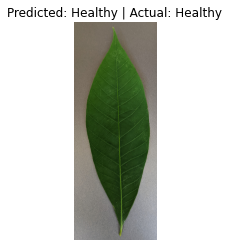

Image: Healthy\PXL_20230729_064736897.jpg | Predicted: Healthy | Actual: Healthy


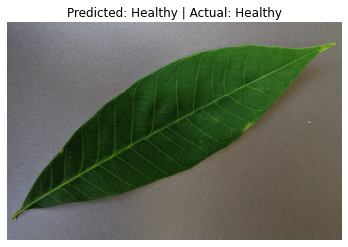

Image: Healthy\PXL_20230729_064800804.jpg | Predicted: Healthy | Actual: Healthy


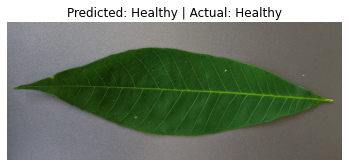

Image: Healthy\PXL_20230729_064816244.jpg | Predicted: Healthy | Actual: Healthy


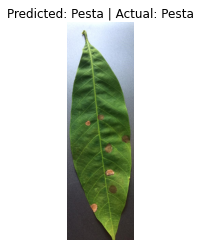

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.02 AM.jpeg | Predicted: Pesta | Actual: Pesta


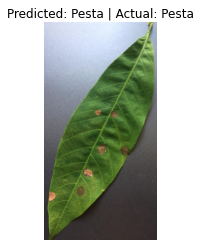

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.03 AM.jpeg | Predicted: Pesta | Actual: Pesta


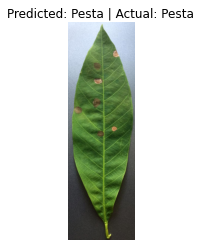

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.06 AM.jpeg | Predicted: Pesta | Actual: Pesta


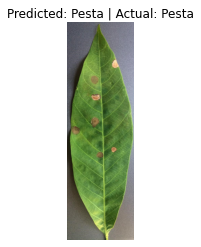

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.08 AM.jpeg | Predicted: Pesta | Actual: Pesta


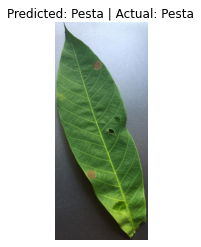

Image: Pesta\WhatsApp Image 2023-04-12 at 11.43.54 AM.jpeg | Predicted: Pesta | Actual: Pesta


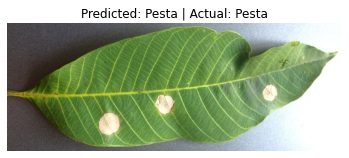

Image: Pesta\WhatsApp Image 2023-04-12 at 11.50.09 AM.jpeg | Predicted: Pesta | Actual: Pesta


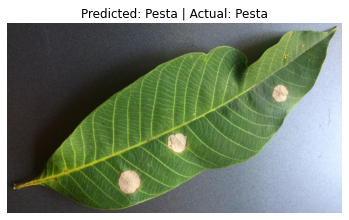

Image: Pesta\WhatsApp Image 2023-04-12 at 11.59.11 AM.jpeg | Predicted: Pesta | Actual: Pesta


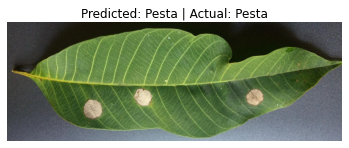

Image: Pesta\WhatsApp Image 2023-04-12 at 11.59.17 AM.jpeg | Predicted: Pesta | Actual: Pesta


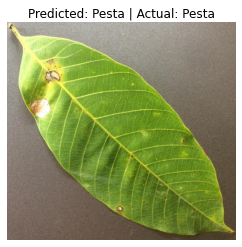

Image: Pesta\WhatsApp Image 2023-04-12 at 11.59.31 AM.jpeg | Predicted: Pesta | Actual: Pesta


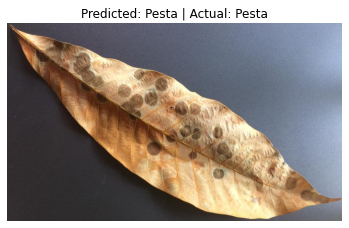

Image: Pesta\WhatsApp Image 2023-04-12 at 12.00.03 PM.jpeg | Predicted: Pesta | Actual: Pesta


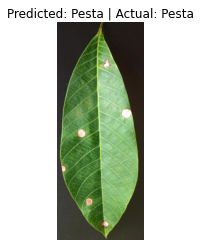

Image: Pesta\WhatsApp Image 2023-04-12 at 12.04.49 PM.jpeg | Predicted: Pesta | Actual: Pesta


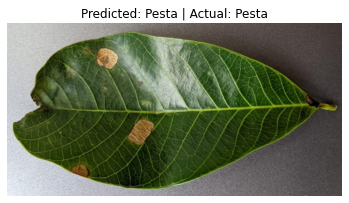

Image: Pesta\q15.jpg | Predicted: Pesta | Actual: Pesta


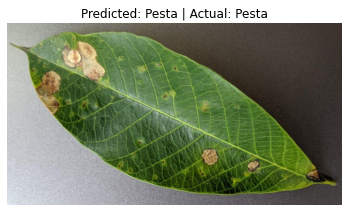

Image: Pesta\q16.jpg | Predicted: Pesta | Actual: Pesta


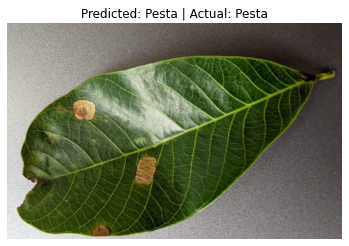

Image: Pesta\q17.jpg | Predicted: Pesta | Actual: Pesta


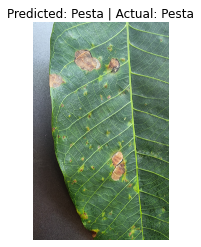

Image: Pesta\x16.jpg | Predicted: Pesta | Actual: Pesta


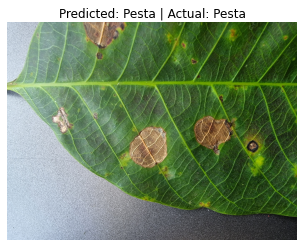

Image: Pesta\x25.jpg | Predicted: Pesta | Actual: Pesta


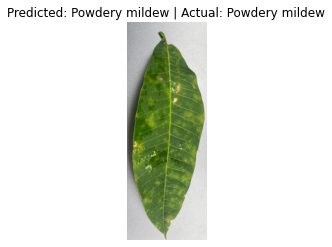

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.35 PM (7).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


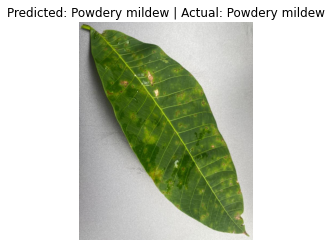

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.35 PM (8).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


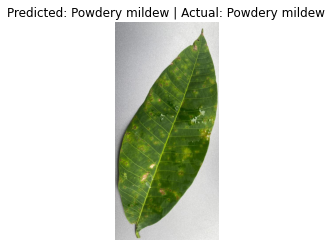

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.35 PM (9).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


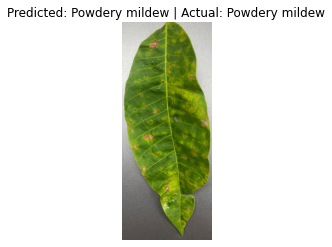

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM (4).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


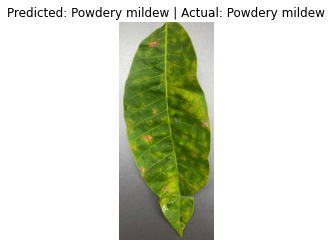

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM (5).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


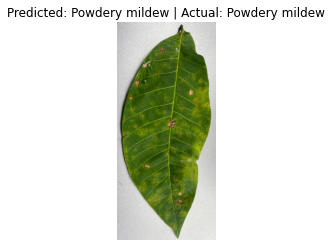

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM (8).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


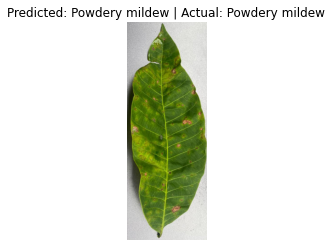

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM.jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


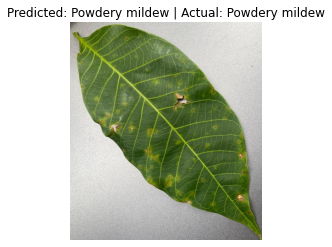

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.13.38 PM (1).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


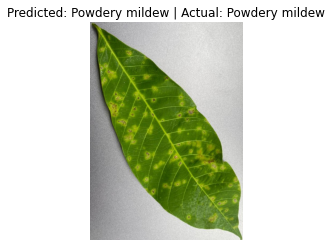

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.13.52 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


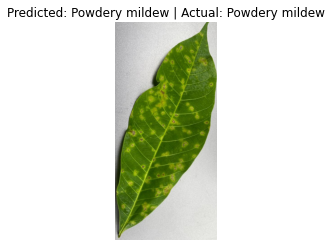

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.13.52 PM (5).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


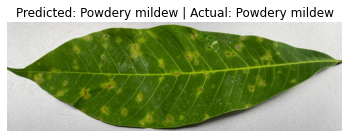

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.22.13 PM (1).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


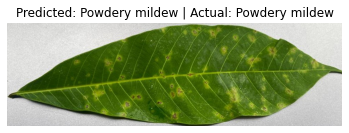

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.22.14 PM (2).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


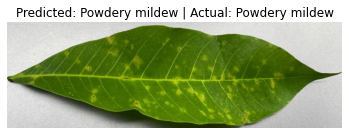

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.22.17 PM.jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


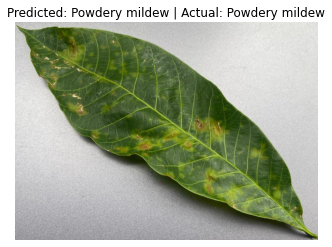

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.39.04 PM (1).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


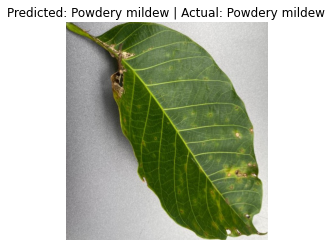

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.40.06 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


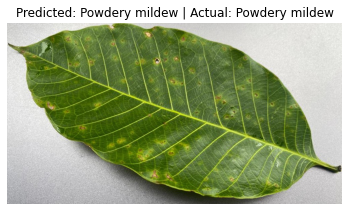

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.40.08 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


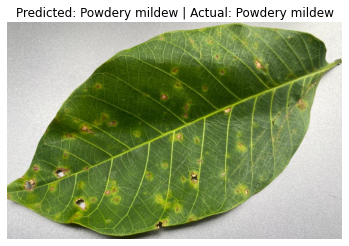

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.42.00 PM (5).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


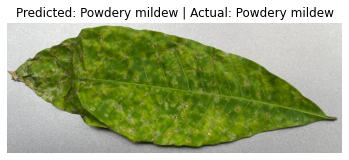

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.42.01 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


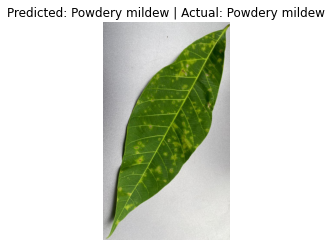

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.43.05 PM (11).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


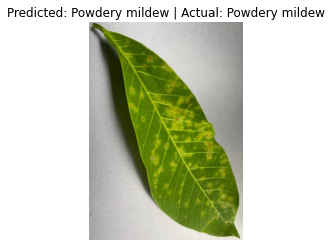

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.43.05 PM (25).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


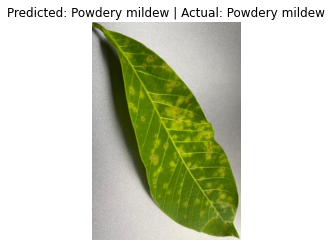

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.43.05 PM (26).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


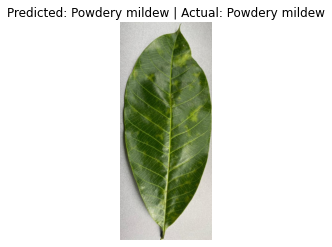

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.45.07 PM (7).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew


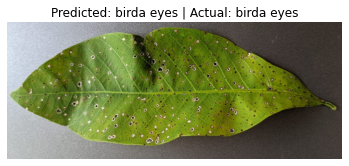

Image: birda eyes\WhatsApp Image 2023-04-21 at 8.54.56 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


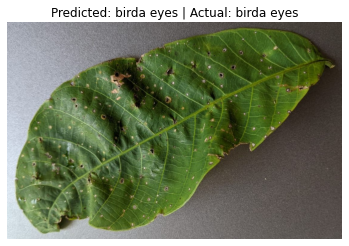

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.00.16 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


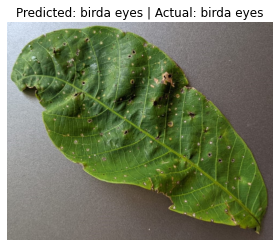

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.00.17 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


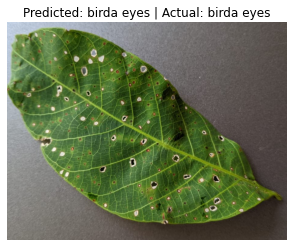

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.20 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


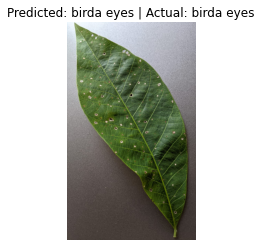

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.21 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


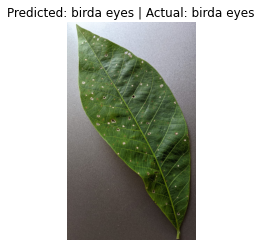

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.22 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


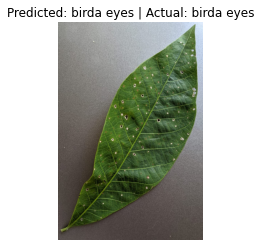

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.23 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


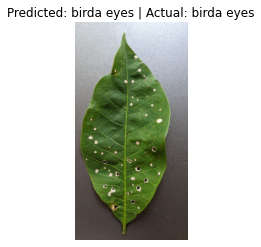

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.27 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


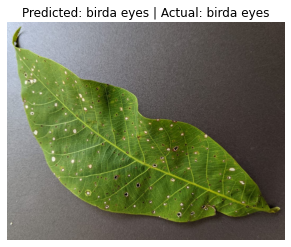

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.38 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


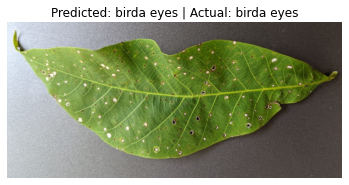

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.39 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


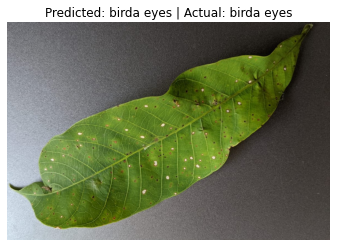

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.40 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


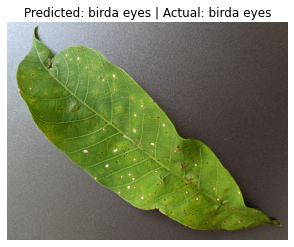

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.41 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


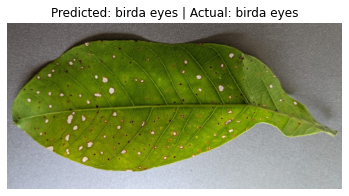

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.01.46 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


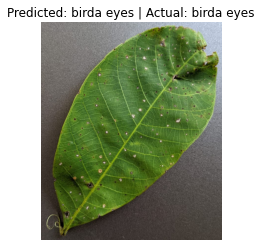

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.03.28 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


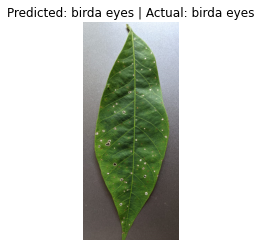

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.03.46 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


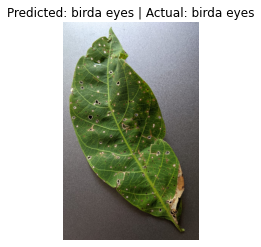

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.03.52 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


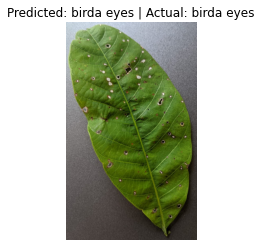

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.04.00 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


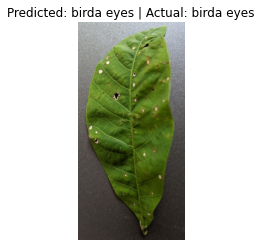

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.04.02 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


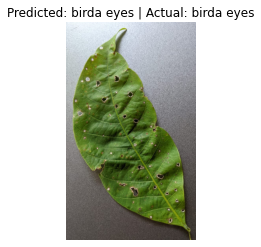

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.04.06 PM.jpeg | Predicted: birda eyes | Actual: birda eyes


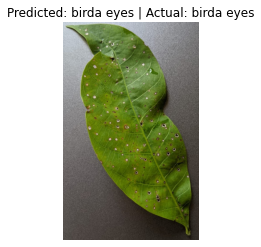

Image: birda eyes\WhatsApp Image 2023-04-21 at 9.04.12 PM (1).jpeg | Predicted: birda eyes | Actual: birda eyes


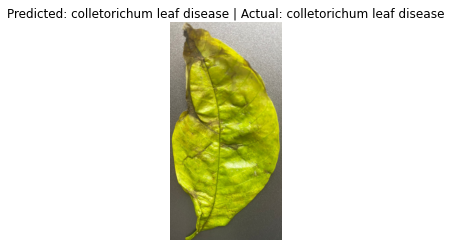

Image: colletorichum leaf disease\IMG-20230322-WA0011.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


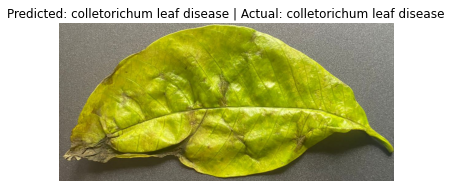

Image: colletorichum leaf disease\IMG-20230322-WA0012(1).jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


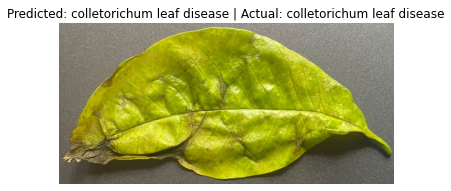

Image: colletorichum leaf disease\IMG-20230322-WA0012.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


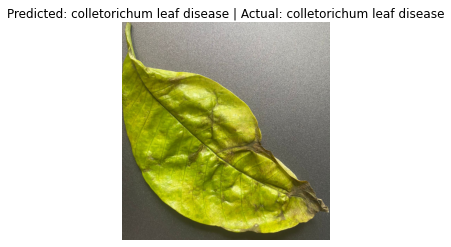

Image: colletorichum leaf disease\IMG-20230322-WA0022.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


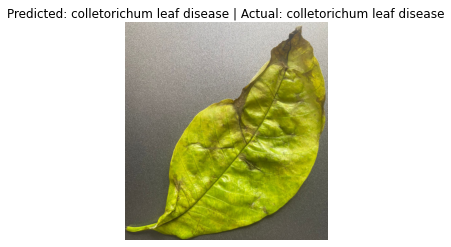

Image: colletorichum leaf disease\IMG-20230322-WA0023.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


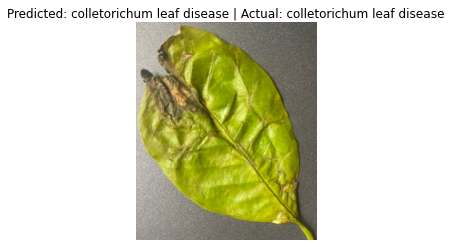

Image: colletorichum leaf disease\IMG-20230322-WA0026.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


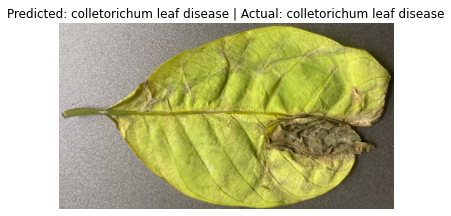

Image: colletorichum leaf disease\IMG-20230322-WA0028.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


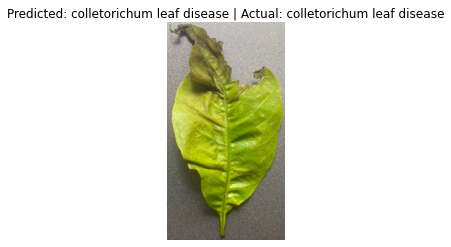

Image: colletorichum leaf disease\IMG-20230322-WA0034.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


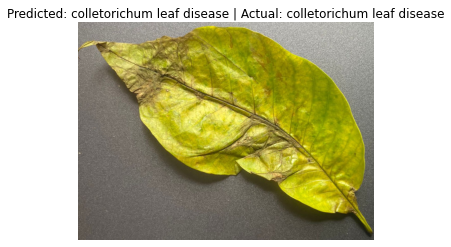

Image: colletorichum leaf disease\IMG-20230322-WA0053.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


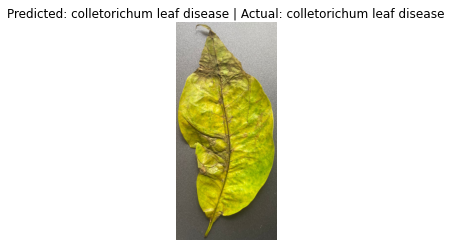

Image: colletorichum leaf disease\IMG-20230322-WA0055.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


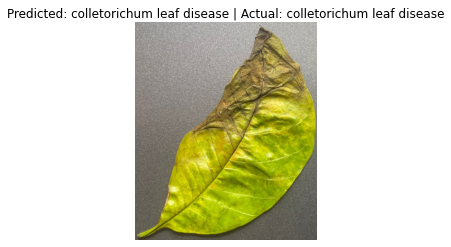

Image: colletorichum leaf disease\IMG-20230322-WA0057.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


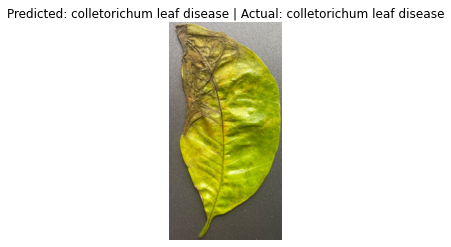

Image: colletorichum leaf disease\IMG-20230322-WA0060.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


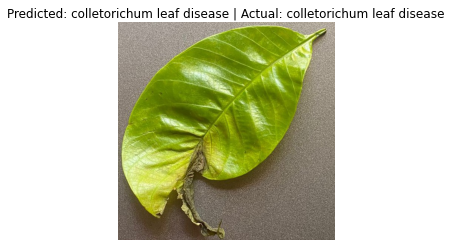

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 1.35.45 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


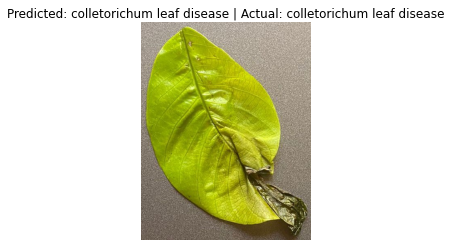

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 1.44.44 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


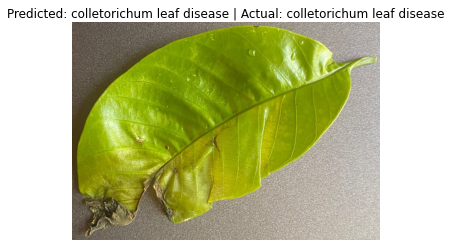

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 1.45.27 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


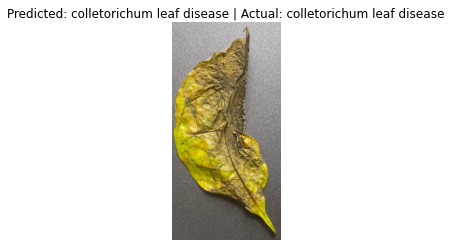

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.33.20 PM (1).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


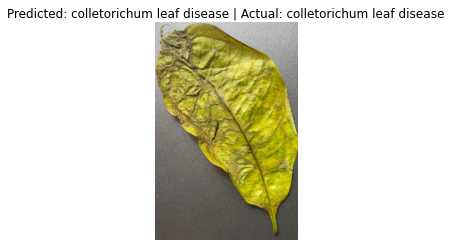

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.33.40 PM (2).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


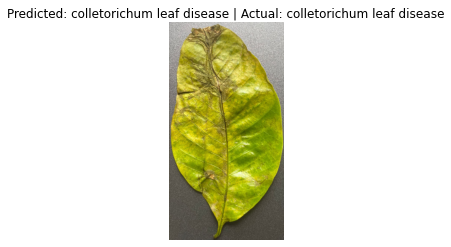

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.33.53 PM (2).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


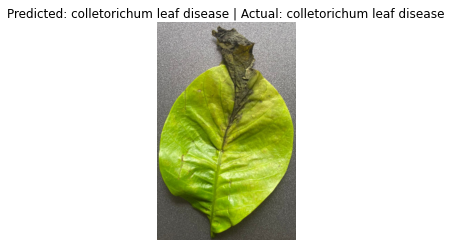

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.02 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


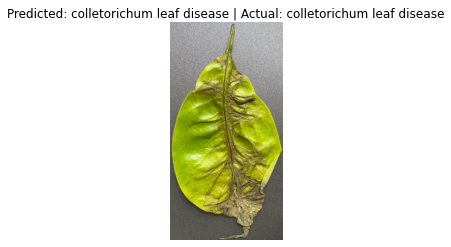

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.28 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


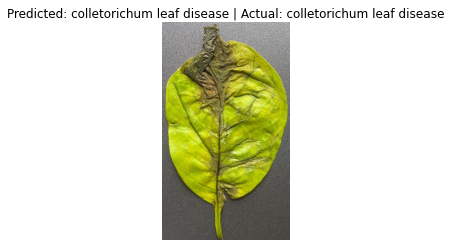

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.29 PM (1).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


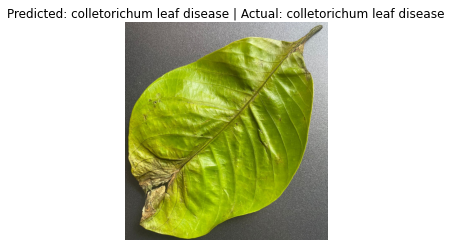

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.51 PM (2).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease


In [40]:
from PIL import Image
import matplotlib.pyplot as plt

# Get predictions from the model
predictions = final_model.predict(test_batches)

# Convert predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)

# Get actual labels from the 'test_batches' object
actual_labels = test_batches.classes

# Get class names from the 'test_batches' object
class_names = list(test_batches.class_indices.keys())

# Iterate through the test batch and display image, predicted label, and actual label
for i in range(len(test_batches.filenames)):
    image_filename = test_batches.filenames[i]
    predicted_class_name = class_names[predicted_labels[i]]
    actual_class_name = class_names[actual_labels[i]]
    
    # Load and display the image using PIL
    image_path = "C:/Users/User/Desktop/mobileNet_Try/dataset/test/" + image_filename  # Replace with the actual path to your test dataset
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f"Predicted: {predicted_class_name} | Actual: {actual_class_name}")
    plt.axis('off')
    plt.show()
    
    print(f"Image: {image_filename} | Predicted: {predicted_class_name} | Actual: {actual_class_name}")


13/13 [==============================] - 8s 592ms/step


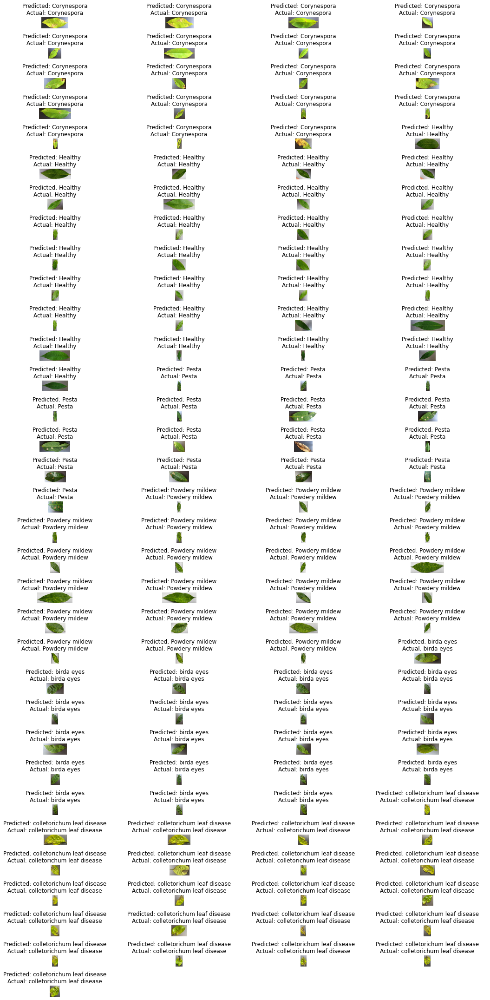

In [49]:
from PIL import Image
import matplotlib.pyplot as plt

from PIL import Image
import matplotlib.pyplot as plt

# Get predictions from the model
predictions = final_model.predict(test_batches)

# Convert predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)

# Get actual labels from the 'test_batches' object
actual_labels = test_batches.classes

# Get class names from the 'test_batches' object
class_names = list(test_batches.class_indices.keys())

# Specify the number of columns for the grid
num_columns = 4

# Calculate the number of rows needed based on the number of images and columns
num_images = len(test_batches.filenames)
num_rows = -(-num_images // num_columns)  # Ceiling division

# Create a subplot grid for displaying images
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 30))

# Iterate through the test batch and display images in a grid layout
for i in range(num_images):
    row = i // num_columns
    col = i % num_columns
    
    image_filename = test_batches.filenames[i]
    predicted_class_name = class_names[predicted_labels[i]]
    actual_class_name = class_names[actual_labels[i]]
    
    # Load and display the image using PIL
    image_path = "C:/Users/User/Desktop/mobileNet_Try/dataset/test/" + image_filename  # Replace with the actual path to your test dataset
    image = Image.open(image_path)
    
    axes[row, col].imshow(image)
    axes[row, col].set_title(f"Predicted: {predicted_class_name}\nActual: {actual_class_name}")
    axes[row, col].axis('off')

# Hide any remaining empty subplots
for i in range(num_images, num_rows * num_columns):
    row = i // num_columns
    col = i % num_columns
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()